In [2]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt


In [3]:
#importing the dataset 
df= pd.read_csv("C:\\Users\\91886\\Downloads\\tvmarketing.csv")
df.head()

,TV,Sales
0,230.1,22.1
1,44.5,10.4
2,17.2,9.3
3,151.5,18.5
4,180.8,12.9


In [4]:
#dimensions of the dataset
df.shape

(200, 2)

In [5]:
#metadata of the datset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   TV      200 non-null    float64
 1   Sales   200 non-null    float64
dtypes: float64(2)
memory usage: 3.2 KB


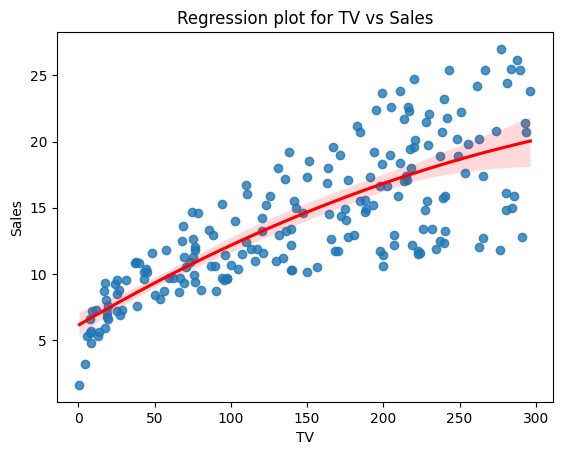

In [6]:
#plotting the independent and dependent variables
x = np.array(df['TV']).reshape(-1,1)
y = np.array(df['Sales']).reshape(-1,1)
sns.regplot(x='TV',y= 'Sales',data = df,order = 2,line_kws={'color':'red'})
plt.title("Regression plot for TV vs Sales")
plt.show()

In [7]:
#lINEAR REGRESSION USING THE INBUILT FUNCTIONS
from sklearn.model_selection import train_test_split
xtrain,xtest,ytrain,ytest = train_test_split(x,y,train_size = 0.8,random_state =0)
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(xtrain,ytrain)
print("intercept :",model.intercept_)
print("slope :",model.coef_)

intercept : [7.29249377]
slope : [[0.04600779]]


In [8]:
#linear regression using the formulaes
#Coefficients
mean_x = np.mean(df['TV'])
mean_y = np.mean(df['Sales'])

# Calculate variance of x and y
var_x = np.var(df['TV'], ddof=1)
var_y = np.var(df['Sales'], ddof=1)

# Calculate covariance of x and y
cov_xy = np.cov(df['TV'],df['Sales'], ddof=1)[0,1]
# Calculate slope and intercept
b = cov_xy / var_x
a = mean_y - b * mean_x

# Print the slope and intercept
print("Intercept: ", a)
print("Slope: ", b)

Intercept:  7.032593549127694
Slope:  0.04753664043301976


In [9]:
#y_pred using the inbuilt function 
y_pred = model.predict(xtest)
y_pred[:5]

array([[10.47623281],
       [ 9.59288325],
       [11.45159795],
       [20.62095042],
       [15.12301956]])

In [10]:
#y_pred using the formulae approach
y_pred_f = b*xtest + a
y_pred[:5]

array([[10.47623281],
       [ 9.59288325],
       [11.45159795],
       [20.62095042],
       [15.12301956]])

In [11]:
ytest[:5]

array([[11.3],
       [ 8.4],
       [ 8.7],
       [25.4],
       [11.7]])

In [12]:
#calculating the mean squared error
MSE = np.sum((y_pred - ytest)**2)/len(ytest)
MSE

10.186181934530211

In [13]:
#calculating the R_squared 
r_squared = np.sum((y_pred - mean_y)**2)/np.sum((ytest-mean_y)**2)
r_squared

0.522019039194405

In [139]:
x = np.array(df['TV']).reshape(-1,1)
y = np.array(df['Sales']).reshape(-1,1)


def normalize(X):
    """
    Normalize the input data to have zero mean and unit variance
    """
    X_norm = (X - np.mean(X, axis=0)) / np.std(X, axis=0)
    return X_norm



def gradient_descent(x,y):
    iterations = 150000
    m =0
    c=0
    n= len(x)
    learning_rate = 0.0000345

    for i in range(iterations):
        
        y_pred = m*x + c
        cost = (1/n)* sum([val**2 for val in (y-y_pred)])
        dm = -(2/n)*(sum(x*(y-y_pred)))
        dc = -(2/n)*(sum(y-y_pred))

        m -= learning_rate*dm
        c -= learning_rate*dc
        print("m {} ,c {} ,cost {}, iteration {}".format(m,c,cost,i+1))

gradient_descent(x,y)


m [0.16632738] ,c [0.00096755] ,cost [223.71625], iteration 1
m [0.00033351] ,c [0.00024749] ,cost [222.90884258], iteration 2
m [0.16599205] ,c [0.00121164] ,cost [222.10468017], iteration 3
m [0.00066567] ,c [0.00049497] ,cost [221.30374972], iteration 4
m [0.16565806] ,c [0.00145573] ,cost [220.50603824], iteration 5
m [0.00099649] ,c [0.00074243] ,cost [219.71153279], iteration 6
m [0.16532541] ,c [0.00169982] ,cost [218.92022046], iteration 7
m [0.00132598] ,c [0.00098988] ,cost [218.13208843], iteration 8
m [0.16499409] ,c [0.00194391] ,cost [217.3471239], iteration 9
m [0.00165414] ,c [0.00123731] ,cost [216.56531413], iteration 10
m [0.1646641] ,c [0.00218799] ,cost [215.78664644], iteration 11
m [0.00198097] ,c [0.00148472] ,cost [215.01110819], iteration 12
m [0.16433543] ,c [0.00243207] ,cost [214.23868681], iteration 13
m [0.00230648] ,c [0.00173212] ,cost [213.46936975], iteration 14
m [0.16400808] ,c [0.00267615] ,cost [212.70314453], iteration 15
m [0.00263068] ,c [0.001

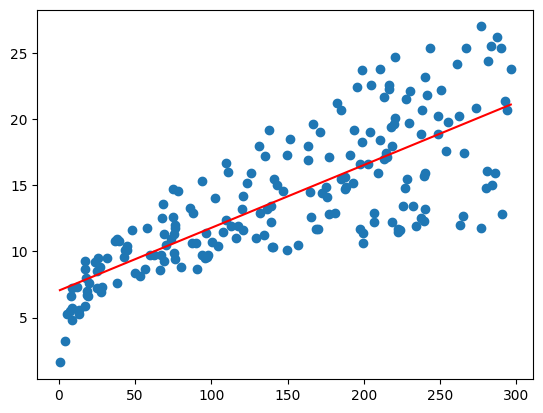

In [15]:
Y_pred = m*xtest + c

plt.scatter(x, y) 
plt.plot([min(x), max(x)], [min(Y_pred), max(Y_pred)], color='red')  # regression line
plt.show()